# Pulsar Detection
## Introduction
Pulsars are neutron stars that rotate incredibly fast, and emit radiation at regular intervals, or pulses (Lommen, 2015). These pulses are cause by the powerful magnetic fields of these stars that cause a flow of particles to travel close to the speed of light (Lommen, 2015). This results in the emission of a strong light beam from each pole of the star (Lommen, 2015). The axis of rotation is not aligned with the poles, which means that the light beams are rotating at the same speed as the star (Lommen, 2015). From earth, these beams can only be detected as they pass through the field of view. As such, the emission of the frequency of detection of these beams from earth can be used to determine the stars’ rotation speed (Lommen, 2015). 

This data set includes information taken from the High Time Resolution Universe (HTRU) Southern Low Latitude Pulsar Survey, which used the Parkes 64 meter radio telescope to detect pulsar radio emissions (Cameron, et al., 2020). Because pulsars are typically very far away from earth, their emission signals have very low intensities and can be difficult to interpret. As such, millions of signals from pulses received by the telescope are integrated to create a pulse profile that can be used to analyze whether the signal is coming from a pulsar (Lyne & Graham-Smith, 2012). This profile consists of a plot of intensity of the radio wave signal (y axis) and proportion of the rotational phase that is covered by the pulse, measured in degrees (x axis) (Lyne & Graham-Smith, 2012). These profiles integrate so many individual pulses, that the variations between individual pulses become negligible (Lyne & Graham-Smith, 2012). In the astrophysics community, theses are referred to as integrated radio pulse profiles. Each of the characterizing features of pulsars will be related to a specific variable within the dataset and used to create a model that can identify pulsar signals with very high accuracy. 

Statistical analysis of these integrated pulse profiles provides metrics that can be used to identify the signals received from the telescope as pulsars. Firstly, the mean of the intensity value of the integrated profile can be used to characterize pulsars, as this value is a simple metric representing intensity of the signal emitted by the star and pulsars emit high intensities (Lyne & Graham-Smith, 2012). As the signal intensity is on the y axis of the integrated profile, the mean y value can be taken to determine the mean intensity; this is a column in the selected dataset

Secondly, the amount of the rotational phase that is covered by a pulsar allows them to be characterized. Typically, pulsars will cover between 10˚ and 20˚ of the rotational phase (Lyne & Graham-Smith, 2012). As the the rotational phase, measured in degrees, is on the x axis of the integrated profiles, the amount of the rotational phase that is covered by the pulses is proportional to the standard deviation of the curve, which is provided in the selected dataset.

Thirdly, the radio emissions of pulsars tend to be relatively symmetrical and cone-shaped as they are emitted from the poles of the star (Lyne & Graham-Smith, 2012). As such, the integrated profiles of pulsars tend to be symmetrical. Furthermore, the skewness of the curve, a metric provided in the dataset, is inversely proportional to the symmetry of integrated profile.

Finally, some pulsars, especially those that are relatively young, tend to have a second, smaller pulse that is observed when the magnetic dipole axis is close to perpendicular to the axis of rotation (Lyne & Graham-Smith, 2012). This phenomenon causes a small, second peak in the integrated profile and can be used to characterize pulsars (Lyne & Graham-Smith, 2012). Within the integrated profile, this second peak, which is known as the interpulse, will result in more outlier values, which are far from the mean of the population. As such, the excess kurtosis of the integration profile, which is a metric provided in the dataset, will be strongly affected in profiles with a second peak.

The dataset also contains information about the DM-SNR curves of the signals, however these curves are very complex and beyond the scope of this report. As such, none of the DM-SNR metrics from the dataset are used in the classification model.

With a telescope as powerful as the Parkes 64 meter radio telescope, many emission signals are received and are used to form integrated radio pulse profiles (Cameron, et al., 2020). However, not all of these signal come from pulsars, as many celestial objects emit similar signals. As such, the aforementioned statistical values extracted from the pulse profiles can be used to classify radio signals as pulsar emissions. The goal of this report is to create a model using the R Commander to classify radio signals as pulsars or non-pulsars, using a K nearest-neighbour classification.ulsar. 
 
Our research question is: 
“Can we build a reliably accurate model that can predict whether an astronomical observation is a pulsar based on the characteristics of the signal received from e it?”



Why is this Useful? 
Pulsars can prove to be extremely valuable astronomical objects and their identification and study are valuable for a variety of reasons. 

-	Pulsars are extremely accurate timing devices and act as natural celestial clocks which can be used for many practical applications which includes testing the theory and relativity and studying the properties of the int.erstellar medium
-	Pulsar detection can also aid in exoplanet detection. Studying the variations in the periods of pulsars was one of the first methods used to detect exoplanets.
-	Pulsars can be used to further understand the behavior of particle physics under the influence of heavy electromagnetic radiations and the rapid spinning of the pulsar star, thus broadening the knowledge of the subject and helping scientists understand various astrophysical processes.
-	Pulsars are formed through supernova explosions, which occur when a star has exhausted all its nuclear fuel. They thus become an essential component in understanding theh evolution and dsa
-	These facts are sourced from Lommen, 2015

The first step is to load all the necessary libraries. 

In [1]:
install.packages("MLmetrics")
install.packages("themis")
install.packages("yardstick")
library(MLmetrics)
library(yardstick)
library(repr)
library(tidyverse)
library(tidymodels)
options(repr.matrix.max.rows = 10)
library(themis)
library(RColorBrewer)
library(GGally)

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


Attaching package: ‘MLmetrics’


The following object is masked from ‘package:base’:

    Recall


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
✖ readr::spec()   masks yardstick::spec()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom  

In [2]:
columns <- c("mean_integrated_profile",
"std_integrated_profile",
"exc_kurtois_integrated_profile",
"skewness_integrated_profile",
"mean_dmsnr",
             "std_dmsnr",
             "exc_kurtois_dmsnr",
             "skewness_dmsnr",
             "Class")


pulsar_data <- read_csv("HTRU_2.csv", col_names = columns)
pulsar_data <- as_tibble(pulsar_data)

pulsar_data

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): mean_integrated_profile, std_integrated_profile, exc_kurtois_integr...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


mean_integrated_profile,std_integrated_profile,exc_kurtois_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,exc_kurtois_dmsnr,skewness_dmsnr,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,0
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,0
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,0
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,0
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,0
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
136.4297,59.84742,-0.1878456,-0.73812297,1.296823,12.16606,15.450260,285.931022,0
122.5547,49.48561,0.1279781,0.32306090,16.409699,44.62689,2.945244,8.297092,0
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,0


One thing to note is that this dataset does not have any missing values and hence simplifies our data cleaning process. 

In the determination of pulsars, the columns that talk about the excess kurtois in the integrated and dmsnr profiles, give us the distribution of characteristics of the pulsar signals which aren't as important as the remaining variables. Thus we can ignore these columns. 

In this data another important point to note is that the Class variable is encoded to be either 0 or 1. This doesn't tell us a lot about the observation we are trying to predict. Here, 1 represents a pulsar while 0 represents a spurious observation. We can convert these to be more desrciptive in the following manner

In [3]:
pulsar_data_new <- pulsar_data |>
mutate(Class = as.character(Class)) |>
mutate(Class = fct_recode(Class, "pulsar" = "1", "non_pulsar" = "0"))|>
mutate(Class = as_factor(Class))

pulsar_data_new

mean_integrated_profile,std_integrated_profile,exc_kurtois_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,exc_kurtois_dmsnr,skewness_dmsnr,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,non_pulsar
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,non_pulsar
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,non_pulsar
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,non_pulsar
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,non_pulsar
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
136.4297,59.84742,-0.1878456,-0.73812297,1.296823,12.16606,15.450260,285.931022,non_pulsar
122.5547,49.48561,0.1279781,0.32306090,16.409699,44.62689,2.945244,8.297092,non_pulsar
119.3359,59.93594,0.1593631,-0.74302540,21.430602,58.87200,2.499517,4.595173,non_pulsar


In [4]:
set.seed(1234) 
pulsar_split <- initial_split(pulsar_data_new, prop = 0.70, strata = Class)  
training_data <- training(pulsar_split)
pulsar_test <- testing(pulsar_split)

training_data

mean_integrated_profile,std_integrated_profile,exc_kurtois_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,exc_kurtois_dmsnr,skewness_dmsnr,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.1998328,19.110426,7.975532,74.24222,non_pulsar
102.50781,58.88243,0.46531815,-0.5150879,1.6772575,14.860146,10.576487,127.39358,non_pulsar
136.75000,57.17845,-0.06841464,-0.6362384,3.6429766,20.959280,6.896499,53.59366,non_pulsar
93.57031,46.69811,0.53190485,0.4167211,1.6362876,14.545074,10.621748,131.39400,non_pulsar
119.48438,48.76506,0.03146022,-0.1121676,0.9991639,9.279612,19.206230,479.75657,non_pulsar
⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮,⋮
96.0000,44.19311,0.3886740,0.28134362,1.871237,15.83375,9.634927,104.821623,non_pulsar
136.4297,59.84742,-0.1878456,-0.73812297,1.296823,12.16606,15.450260,285.931022,non_pulsar
122.5547,49.48561,0.1279781,0.32306090,16.409699,44.62689,2.945244,8.297092,non_pulsar


Let us now view the summary statistics of the training dataset.

In [5]:
summary_train_df <- summary(training_data)
summary_train_df 

 mean_integrated_profile std_integrated_profile exc_kurtois_integrated_profile
 Min.   :  5.812         Min.   :24.77          Min.   :-1.87601              
 1st Qu.:100.896         1st Qu.:42.34          1st Qu.: 0.02786              
 Median :114.930         Median :46.93          Median : 0.22434              
 Mean   :110.933         Mean   :46.49          Mean   : 0.48748              
 3rd Qu.:127.033         3rd Qu.:50.98          3rd Qu.: 0.47363              
 Max.   :192.617         Max.   :98.78          Max.   : 7.87963              
 skewness_integrated_profile   mean_dmsnr         std_dmsnr     
 Min.   :-1.7919             Min.   :  0.2132   Min.   :  7.37  
 1st Qu.:-0.1918             1st Qu.:  1.9289   1st Qu.: 14.47  
 Median : 0.1981             Median :  2.8194   Median : 18.53  
 Mean   : 1.8406             Mean   : 12.7524   Mean   : 26.52  
 3rd Qu.: 0.9262             3rd Qu.:  5.5069   3rd Qu.: 28.54  
 Max.   :65.3860             Max.   :222.4214   Max.   :1

We can convert the above into a tibble in the following manner. 

In [6]:
summary_df <- data.frame(
    summaries = c("Min.", "1st Quartile", "Median","Mean","3rd Quartile","Max."),
    mean_integrated_profile = c(5.812, 100.896, 114.930, 110.933, 127.033, 192.617),
    std_integrated_profile = c(24.77, 42.34, 46.93, 46.49, 50.98, 98.78),
    exc_kurtois_integrated_profile = c(-1.87601, 0.02786, 0.22434, 0.48748, 0.47363, 7.87963),
    skewness_integrated_profile = c(-1.7919, -0.1918, 0.1981, 1.8406, 0.9262, 65.3860),
    mean_dmsnr = c(0.2132, 1.9289, 2.8194, 12.7524, 5.5069, 222.4214),
    std_dmsnr = c(7.37, 14.47, 18.53, 26.52, 28.54, 110.64),
    exc_kurtois_dmsnr = c(-3.139, 5.758, 8.409, 8.274, 10.693, 34.540),
    skewness_dmsnr = c(-1.977, 34.735, 82.346, 104.335, 138.686, 1191.001))

summary_df <- as_tibble(summary_df)
summary_df

summaries,mean_integrated_profile,std_integrated_profile,exc_kurtois_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,exc_kurtois_dmsnr,skewness_dmsnr
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Min.,5.812,24.77,-1.87601,-1.7919,0.2132,7.37,-3.139,-1.977
1st Quartile,100.896,42.34,0.02786,-0.1918,1.9289,14.47,5.758,34.735
Median,114.930,46.93,0.22434,0.1981,2.8194,18.53,8.409,82.346
Mean,110.933,46.49,0.48748,1.8406,12.7524,26.52,8.274,104.335
3rd Quartile,127.033,50.98,0.47363,0.9262,5.5069,28.54,10.693,138.686
Max.,192.617,98.78,7.87963,65.3860,222.4214,110.64,34.540,1191.001


In [7]:
pulsar_train_corr <- training_data |>
mutate(Class = fct_recode(Class, "1" = "pulsar" , "0" = "non_pulsar"))|>
mutate(Class = as.numeric(Class))


pulsar_cor <- cor(pulsar_train_corr)
pulsar_cor

,mean_integrated_profile,std_integrated_profile,exc_kurtois_integrated_profile,skewness_integrated_profile,mean_dmsnr,std_dmsnr,exc_kurtois_dmsnr,skewness_dmsnr,Class
mean_integrated_profile,1.0000000,0.56489472,-0.8746634,-0.7440433,-0.31003074,-0.3091994,0.24174342,0.14874107,-0.6790115
std_integrated_profile,0.5648947,1.00000000,-0.5365838,-0.5499405,-0.02276125,-0.0630311,0.04790841,0.03764927,-0.3858463
exc_kurtois_integrated_profile,-0.8746634,-0.53658380,1.0000000,0.9485532,0.42393353,0.4343019,-0.34729123,-0.21770113,0.7991422
skewness_integrated_profile,-0.7440433,-0.54994052,0.9485532,1.0000000,0.41889548,0.4180390,-0.33481476,-0.20785386,0.7200326
mean_dmsnr,-0.3100307,-0.02276125,0.4239335,0.4188955,1.00000000,0.8045173,-0.61967640,-0.35666190,0.4067859
std_dmsnr,-0.3091994,-0.06303110,0.4343019,0.4180390,0.80451728,1.0000000,-0.81068810,-0.57391868,0.4898545
exc_kurtois_dmsnr,0.2417434,0.04790841,-0.3472912,-0.3348148,-0.61967640,-0.8106881,1.00000000,0.92278026,-0.3928107
skewness_dmsnr,0.1487411,0.03764927,-0.2177011,-0.2078539,-0.35666190,-0.5739187,0.92278026,1.00000000,-0.2585446
Class,-0.6790115,-0.38584631,0.7991422,0.7200326,0.40678590,0.4898545,-0.39281068,-0.25854457,1.0000000


From the above correlation matrix, we note that the mean_integrated_profile, exc_kurtois_integrated_profile, and skewness_integrated_profile have magnitudes of correlation coefficients with our target greater than 0.5 and hence are all important variables in determining our target variable. We also note that the std_dmsnr column has a value of correlation coefficient almost equal to 0.5 and hence we consider that column in our initial list of predictors as well

In [8]:
pulsar_train <- training_data |>
select(mean_integrated_profile,
       exc_kurtois_integrated_profile, 
       skewness_integrated_profile,
       std_dmsnr,
      Class)

pulsar_train

mean_integrated_profile,exc_kurtois_integrated_profile,skewness_integrated_profile,std_dmsnr,Class
<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,-0.23457141,-0.6996484,19.110426,non_pulsar
102.50781,0.46531815,-0.5150879,14.860146,non_pulsar
136.75000,-0.06841464,-0.6362384,20.959280,non_pulsar
93.57031,0.53190485,0.4167211,14.545074,non_pulsar
119.48438,0.03146022,-0.1121676,9.279612,non_pulsar
⋮,⋮,⋮,⋮,⋮
96.0000,0.3886740,0.28134362,15.83375,non_pulsar
136.4297,-0.1878456,-0.73812297,12.16606,non_pulsar
122.5547,0.1279781,0.32306090,44.62689,non_pulsar


So far, we've only performed wrangling and cleaning tasks and determined the columns through their correlation coefficients. Now let us visualise the distribution of the above variables through boxplots to analyze if our chose variables are indeed useful for our prediction model. 

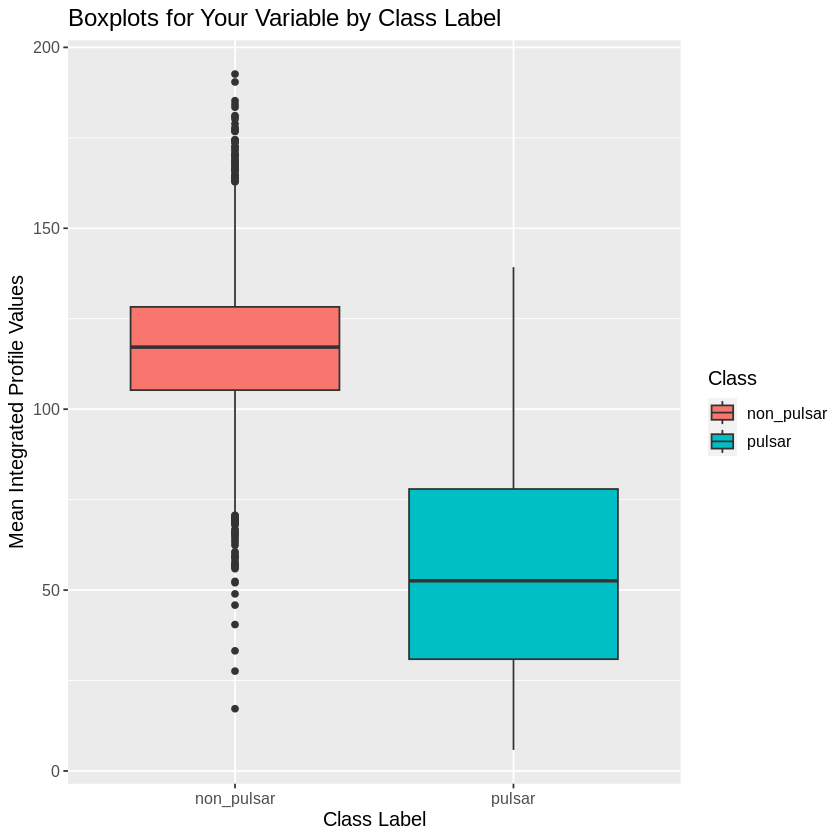

In [9]:
pulsar_train_new_distrib <- ggplot(pulsar_train, aes(x = Class, y = mean_integrated_profile, fill = Class)) +
  geom_boxplot() +
  labs(title = "Boxplots for Your Variable by Class Label",
       x = "Class Label",
       y = "Mean Integrated Profile Values") +
theme(text = element_text(size = 12))

pulsar_train_new_distrib

From the above, we see that the values of the mean integrated profile are quite significantly different for pulsars and non-pulsars. This is because there isn't any overlap between the values of the majority of the classes. This means that the majority of each class has a different range of Mean Integrated Profile values. 

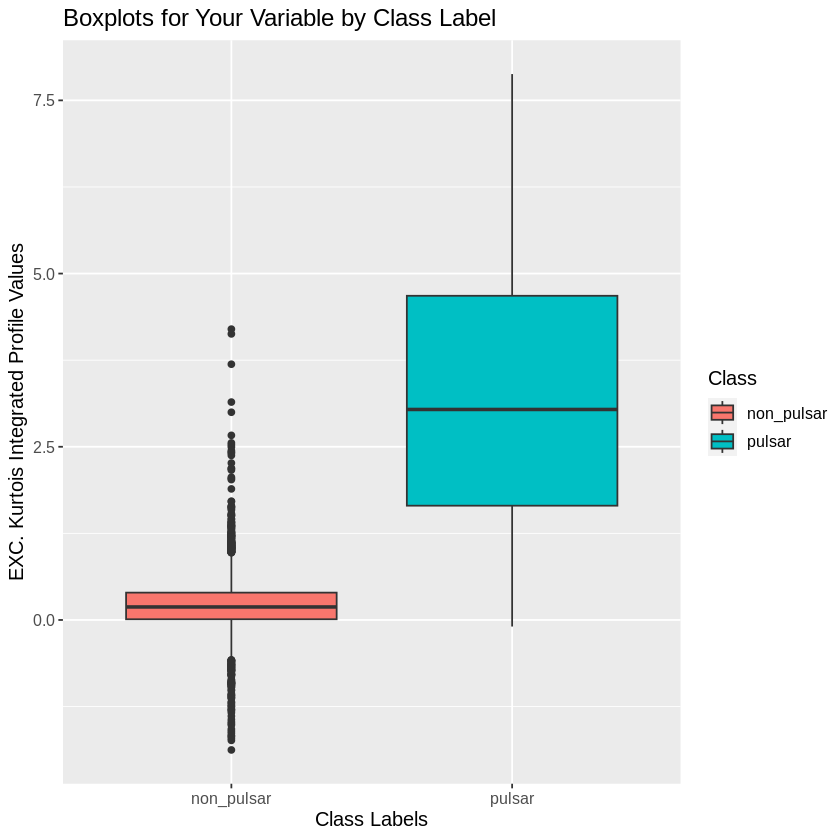

In [10]:
ekip_boxplot <- ggplot(pulsar_train, aes(x = Class, y = exc_kurtois_integrated_profile, fill = Class)) +
  geom_boxplot() +
  labs(title = "Boxplots for Your Variable by Class Label",
       x = "Class Labels",
       y = "EXC. Kurtois Integrated Profile Values") +
theme(text = element_text(size = 12))

ekip_boxplot

Once again, we see that the values of the Excess Kurtois Integrated Profile are quite significantly different for pulsars and non-pulsars. In particular, we note, that non-pulsars have a very small range of values for this variable whereas pulsars have a significantly larger range of values. This shows that this variable is a crucial predictor in our dataset. O  There is a very slight overlap between the outliers of non-pulsars with those of pulsars and hence this can be ignored. The majority of each class has a different range of Excess Kurtois Integrated Profile values. 

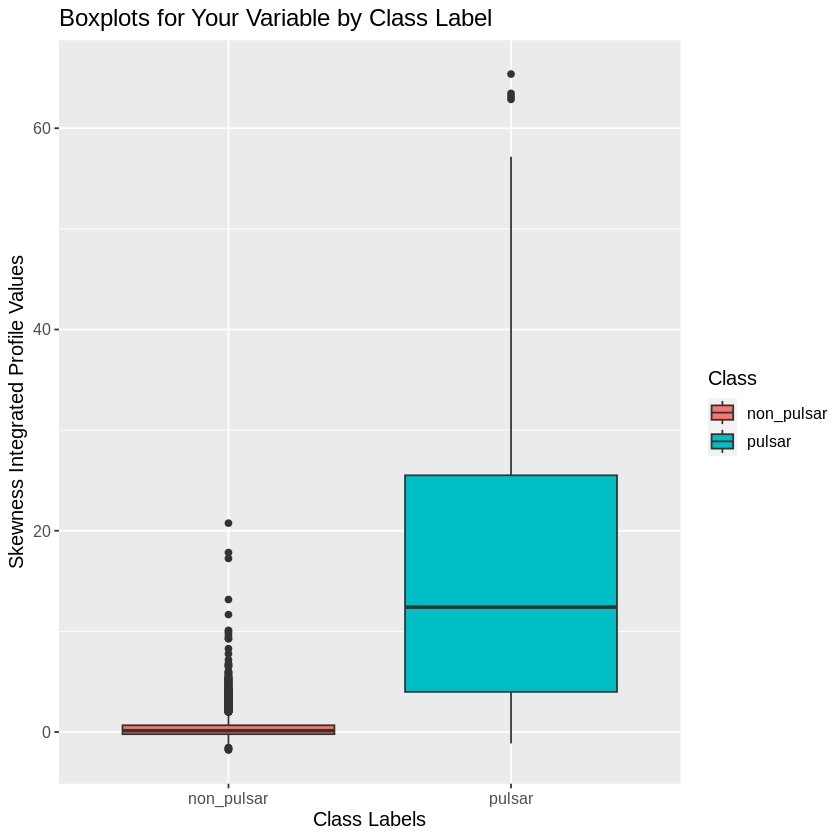

In [11]:
sip_boxplot <- ggplot(pulsar_train, aes(x = Class, y = skewness_integrated_profile, fill = Class)) +
  geom_boxplot() +
  labs(title = "Boxplots for Your Variable by Class Label",
       x = "Class Labels",
       y = "Skewness Integrated Profile Values") +
theme(text = element_text(size = 12))

sip_boxplot

Similar to the Excess Kurtois Integrated Profile we see that the values of the Skewness Integrated Profile are quite significantly different for pulsars and non-pulsars and that non-pulsars have a very small range of values for this variable whereas pulsars have a significantly larger range of values. Hence this variable is also crucial in predicting the class of our observation.

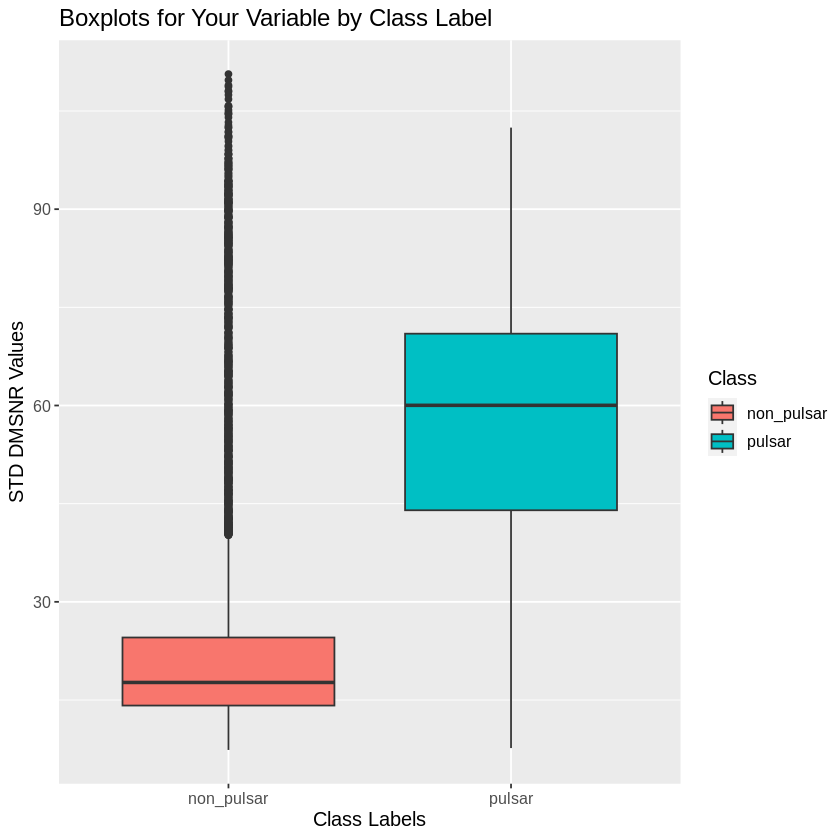

In [12]:
std_boxplot <- ggplot(pulsar_train, aes(x = Class, y = std_dmsnr, fill = Class)) +
  geom_boxplot() +
  labs(title = "Boxplots for Your Variable by Class Label",
       x = "Class Labels",
       y = "STD DMSNR Values") +
theme(text = element_text(size = 12))

std_boxplot

For the STD DMSNR values, we note that while for the majority of observations, pulsars and non-pulsars have different values of STD DMSNR, there are many outliers in the non-pulsar case whose STD DMSNR values overlap with those of pulsars. Hence we cannot be sure of how useful this predictor might be in our classification model. We need to perform forward selection to determine its usefulness. 

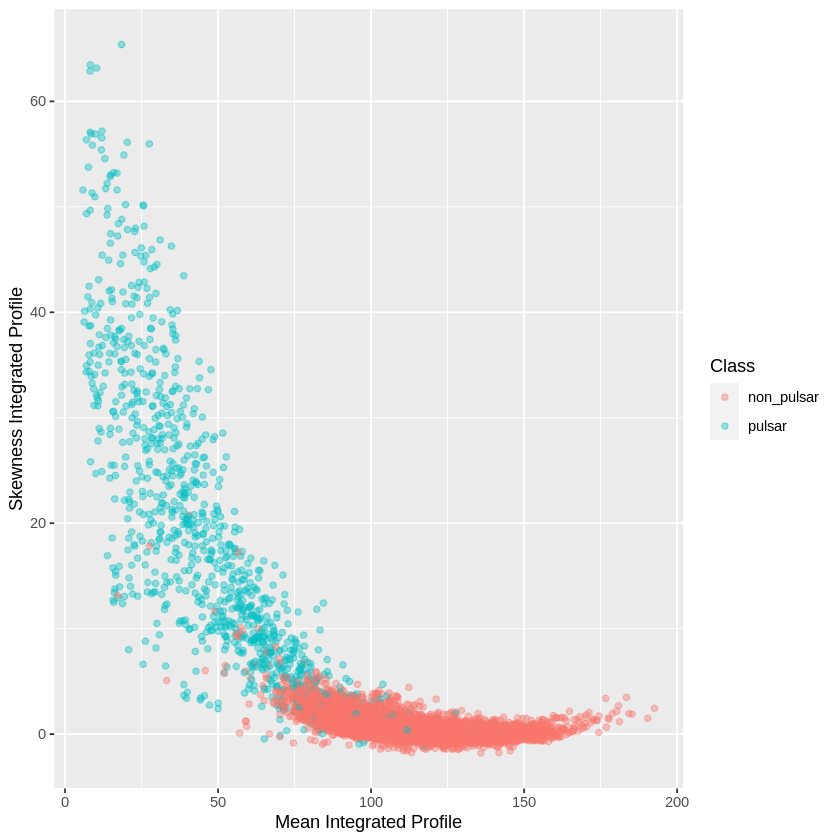

In [13]:
mean_integrated_vs_skewness_integrated_plot <- pulsar_train |>
ggplot(aes(x = mean_integrated_profile, y = skewness_integrated_profile, color = Class)) +
geom_point(alpha = 0.4) + labs(x = "Mean Integrated Profile", y = "Skewness Integrated Profile", color = "Class")

mean_integrated_vs_skewness_integrated_plot

Both are good parameters since they effectively separate the classes. The pulsars have high skewness and low mean, while non-pulsars have higher mean and low skewness values. 

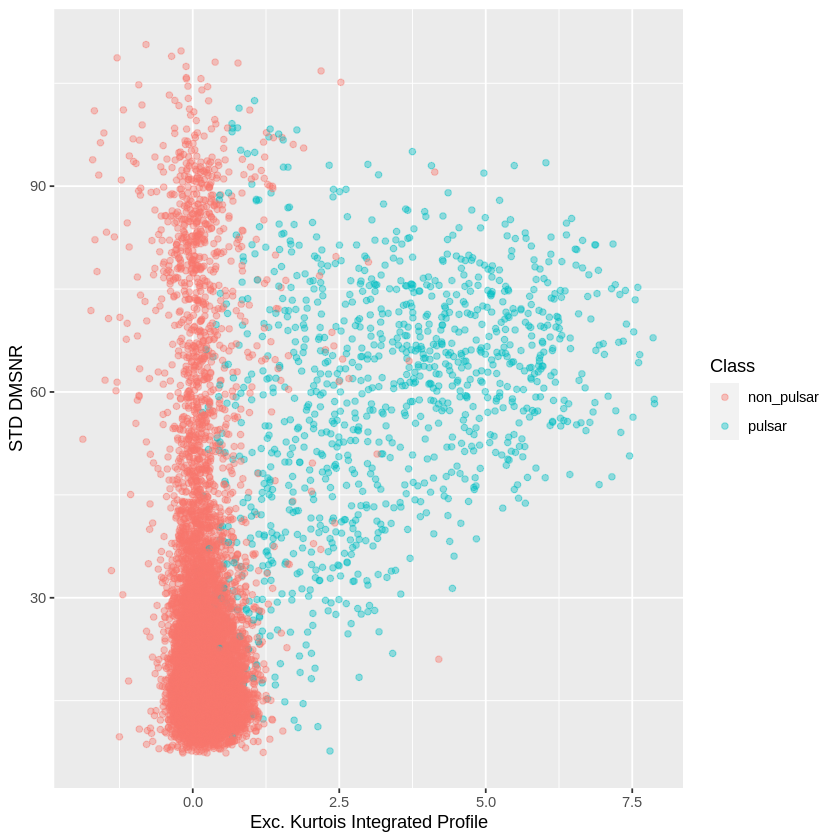

In [14]:
exc_integrated_vs_std_dmsnr_plot <- pulsar_train |>
ggplot(aes(x = exc_kurtois_integrated_profile, y = std_dmsnr, color = Class)) +
geom_point(alpha = 0.4) + labs(x = "Exc. Kurtois Integrated Profile", y = "STD DMSNR", color = "Class")
exc_integrated_vs_std_dmsnr_plot


Once again, we see that these two variables can split the classes pretty well because Exc. Kurtosis Integration profile values are higher for pulsars. However, the values of std_dmsnr are almost equal for both the classes and are hence not as effective in splitting the two classes and hence may not help significantly in prediction. We shall however, decide on whether or not to use it after performing forward selection. (MAKE SURE TO MENTION THIS IN FORWARD SELECTION PART. )

Before we start to create our model, let us have a look at the distribution of class labels in the training dataset.

Class,count
<fct>,<int>
non_pulsar,11376
pulsar,1152


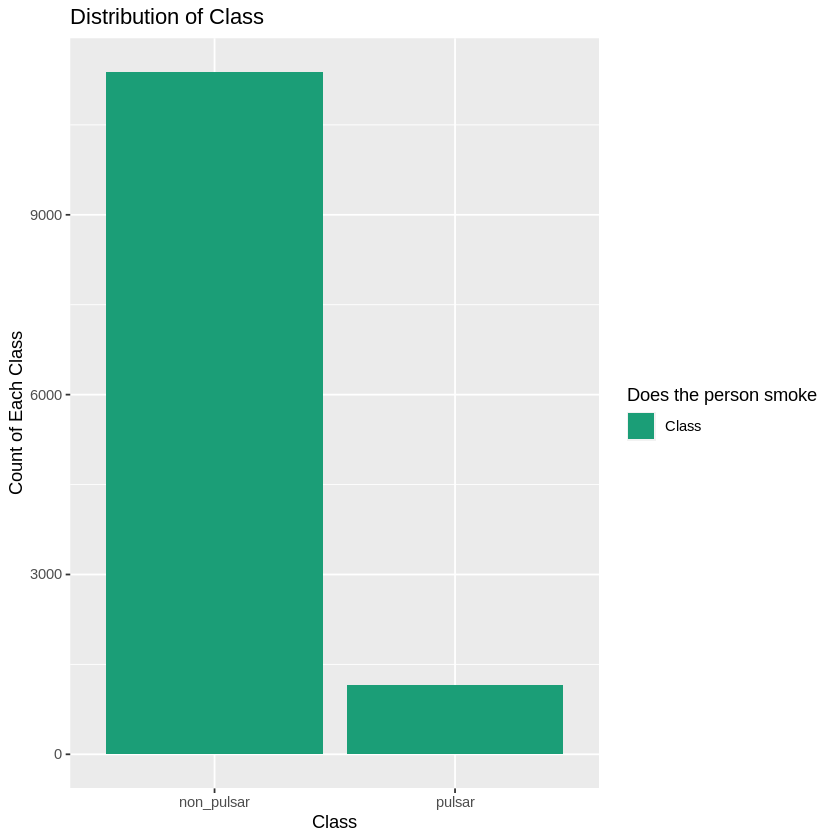

In [15]:
distrib <- pulsar_train |>
group_by(Class)|>
summarize(count = n())

distrib_plot <- distrib |>
ggplot(aes(x = Class, y = count, fill = "Class")) + 
   geom_bar(stat = "identity") + 
   xlab("Class") +
   ylab("Count of Each Class") +
   labs(fill = "Does the person smoke") +
scale_fill_brewer(palette = 'Dark2')+
   ggtitle("Distribution of Class")


distrib 
distrib_plot

Now we notice that the number of each class is not the same and hence, we need to upsample. (write in the discussion section). Then we tune our model and perform cross-validation to determine the best value of k to be used. Here k represents the number of neighbors considered during KNN-classification. 

In [16]:
set.seed(9999) 
grid_vals <- tibble(neighbors = seq(from = 1, to = 100, by = 20))

knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune())|>
set_engine("kknn")|>
set_mode("classification")

knn_recipe <- recipe(Class ~., data = pulsar_train)|>
step_scale()|>
step_center()|>
step_upsample(over_ratio = 1, skip = FALSE)

knn_vfold <- vfold_cv(pulsar_train, v = 5, strata = Class)

knn_results <- workflow()|>
add_recipe(knn_recipe)|>
add_model(knn_spec)|>
tune_grid(resamples = knn_vfold, grid = grid_vals)|>
collect_metrics()|>
filter(.metric == "accuracy")

knn_results 

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9689495,5,0.001355860,Preprocessor1_Model1
21,accuracy,binary,0.9791670,5,0.001003353,Preprocessor1_Model2
41,accuracy,binary,0.9779696,5,0.001057356,Preprocessor1_Model3
61,accuracy,binary,0.9778899,5,0.001066181,Preprocessor1_Model4
81,accuracy,binary,0.9777303,5,0.001250075,Preprocessor1_Model5


Lets view a distribution of accuracies vs k values

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9689495,5,0.001355860,Preprocessor1_Model1
21,accuracy,binary,0.9791670,5,0.001003353,Preprocessor1_Model2
41,accuracy,binary,0.9779696,5,0.001057356,Preprocessor1_Model3
61,accuracy,binary,0.9778899,5,0.001066181,Preprocessor1_Model4
81,accuracy,binary,0.9777303,5,0.001250075,Preprocessor1_Model5


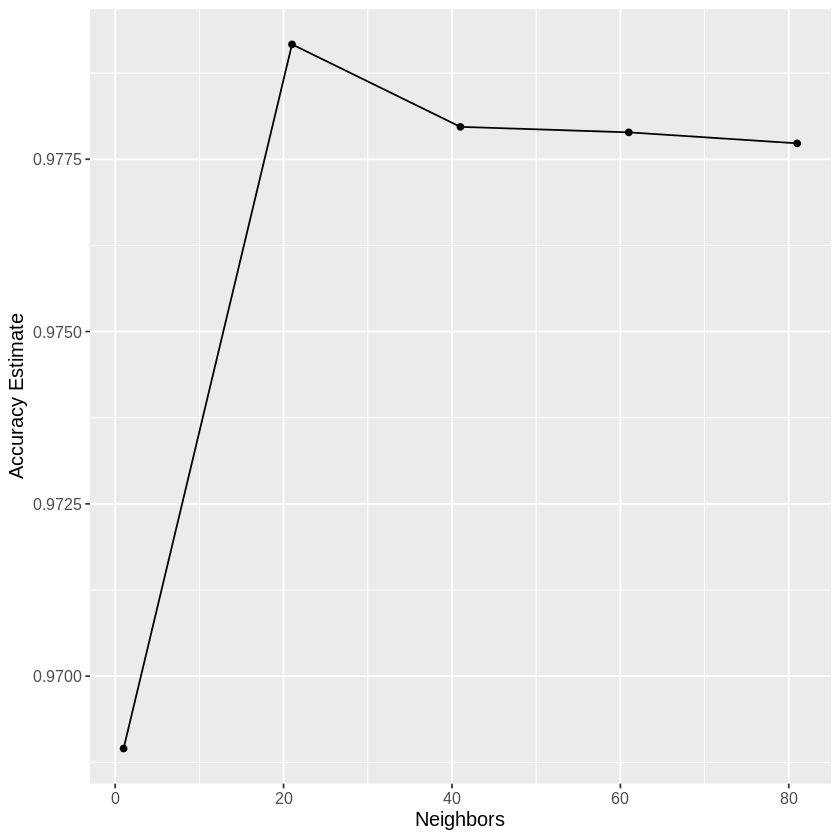

In [17]:
accuracy_vs_k <- ggplot(knn_results, aes(x = neighbors, y = mean)) +
  geom_point() +
  geom_line() +
  labs(x = "Neighbors", y = "Accuracy Estimate") + 
  theme(text = element_text(size = 12))

accuracy_vs_k

knn_results

In [18]:
max_accuracy <- knn_results|>
filter(mean == max(mean))|>
select(mean)|>
slice_head(n = 1)|>
pull()

req_k_value <- knn_results|>
filter(mean == max(mean))|>
select(neighbors)|>
slice_head(n=1)|>
pull()

req_k_value

[1] 21

However, we still cannot be sure that our model, is the best model based on the number of predictors we have chosen. To do this we perform forward selection. 

In [19]:
set.seed(2554)

# create an empty tibble to store the results

col_names <- colnames(pulsar_train |> select(-Class))

accuracies <- tibble(no_of_parameters = integer(), 
                     recipe_string = character(), 
                     accuracy_score = numeric())

# create a model specification
knn_spec_new <- nearest_neighbor(weight_func = "rectangular", 
                             neighbors = req_k_value) |>
     set_engine("kknn") |>
     set_mode("classification")

# create a 5-fold cross-validation object
pulsar_vfold <- vfold_cv(pulsar_train, v = 5, strata = Class)

# store the total number of predictors
n_total <- length(col_names)

# stores selected predictors
selected <- c()

# for every size from 1 to the total number of predictors
for (i in 1:n_total) {
    # for every predictor still not added yet
    accs <- list()
    models <- list()
    for (j in 1:length(col_names)) {
        # create a model string for this combination of predictors
        preds_new <- c(selected, col_names[[j]])
        recipe_string <- paste("Class", "~", paste(preds_new, collapse="+"))

        # create a recipe from the model string
        pulsar_recipe <- recipe(as.formula(recipe_string), 
                                data = pulsar_train) |>
                          step_scale(all_predictors()) |>
                          step_center(all_predictors())

        # tune the KNN classifier with these predictors, 
        # and collect the accuracy for the best K
        acc <- workflow() |>
          add_recipe(pulsar_recipe) |>
          add_model(knn_spec_new) |>
          tune_grid(resamples = pulsar_vfold, grid = req_k_value) |>
          collect_metrics() |>
          filter(.metric == "accuracy") |>
          summarize(mx = max(mean))
        acc <- acc$mx |> unlist()

        # add this result to the dataframe
        accs[[j]] <- acc
        models[[j]] <- recipe_string
    }
    jstar <- which.max(unlist(accs))
    accuracies <- accuracies |> 
      add_row(no_of_parameters = i, 
              recipe_string = models[[jstar]], 
              accuracy_score = accs[[jstar]])
    selected <- c(selected, col_names[[jstar]])
    col_names <- col_names[-jstar]
}
accuracies

Warning message:
“No tuning parameters have been detected, performance will be evaluated using the resamples with no tuning. Did you want to [tune()] parameters?”
Warning message:
“No tuning parameters have been detected, performance will be evaluated using the resamples with no tuning. Did you want to [tune()] parameters?”
Warning message:
“No tuning parameters have been detected, performance will be evaluated using the resamples with no tuning. Did you want to [tune()] parameters?”
Warning message:
“No tuning parameters have been detected, performance will be evaluated using the resamples with no tuning. Did you want to [tune()] parameters?”
Warning message:
“No tuning parameters have been detected, performance will be evaluated using the resamples with no tuning. Did you want to [tune()] parameters?”
Warning message:
“No tuning parameters have been detected, performance will be evaluated using the resamples with no tuning. Did you want to [tune()] parameters?”
Warning message:
“No t

no_of_parameters,recipe_string,accuracy_score
<int>,<chr>,<dbl>
1,Class ~ exc_kurtois_integrated_profile,0.9783683
2,Class ~ exc_kurtois_integrated_profile+mean_integrated_profile,0.9798850
3,Class ~ exc_kurtois_integrated_profile+mean_integrated_profile+skewness_integrated_profile,0.9800445
4,Class ~ exc_kurtois_integrated_profile+mean_integrated_profile+skewness_integrated_profile+std_dmsnr,0.9794059


Here we note that the best accuracy is obtained, by using all the columns except the std_dmsnr feature. This matches the predictions of our original visualisation where we saw that the std_dmsnr column wasn't very effective in segregating the classes. 

Now we train our final model with the required recipe and k value and asses it's accuracy on the test data set. 

In [20]:
set.seed(2399)

knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = req_k_value)|>
set_engine("kknn")|>
set_mode("classification")

knn_recipe <- recipe(Class ~ exc_kurtois_integrated_profile+mean_integrated_profile+skewness_integrated_profile,
                     data = pulsar_train)|>
step_scale()|>
step_center()|>
step_upsample(over_ratio = 1, skip = FALSE)


knn_fit <- workflow()|>
add_recipe(knn_recipe)|>
add_model(knn_spec)|>
fit(pulsar_train)

predictions <- knn_fit |>
  predict(pulsar_test) 

predicted_class <- predictions |>
bind_cols(pulsar_test)

knn_summary <- predicted_class|>
  metrics(truth = Class, estimate = .pred_class) |>
  filter(.metric == 'accuracy')

knn_summary

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9761639


Thus our model can predict whether or not an observation is a pulsar with an accuracy of 97.61%, which is significantly high. Let us also look at the confusion matrix and some other metrics to determine the overall performance of our model.

In [ ]:
set.seed(123)
actual_class <- pulsar_test|>
select(Class)

# Create a confusion matrix
conf_matrix <- table(y_true = pulsar_test$Class, y_pred = predicted_class$.pred_class)
conf_matrix_viz <- as_tibble(table(y_true = pulsar_test$Class, y_pred = predicted_class$.pred_class))

conf_matrix_viz

# Calculate precision, recall, and F1 score manually
# Extract values from the confusion matrix
true_positives <- conf_matrix[2, 2]  # Pulsar correctly predicted
false_positives <- conf_matrix[1, 2]  # Non-pulsar incorrectly predicted as pulsar
false_negatives <- conf_matrix[2, 1]  # Pulsar incorrectly predicted as non-pulsar

# Calculate precision, recall, and F1-score
precision <- true_positives / (true_positives + false_positives)
recall <- true_positives / (true_positives + false_negatives)
f1_score <- 2 * (precision * recall) / (precision + recall)

# Print the metrics
accuracy <- knn_summary |>
select(.estimate)|>
pull()


cat("\nPrecision of Model:", precision, "\n")
cat("Recall of Model:", recall, "\n")
cat("Accuracy of Model: ", accuracy, "\n")
cat("F1 Score of Model:", f1_score, "\n")



We note from the above that all the metrics are significantly high. An accuracy score of 97.6% shows that the model is accurately able to predict pulsars based on the required information form the dataset. This combined with an F1-score of 86% in binary classification, particularly in pulsar detection, is very good due to its balanced representation of precision and recall. This score indicates a proficient trade-off between accurately identifying pulsars (high recall) and avoiding misclassification of non-pulsars as pulsars (high precision). The F1-score's proximity to 1.0 suggests near-perfect precision and recall, showcasing the model's high accuracy. Its usefulness in handling imbalanced datasets, common in pulsar detection (as with our dataset), underscores its robust performance. The interpretability of the F1-score, ranging from 0 (poor) to 1 (perfect), simplifies performance assessment.

## Discussion
Throughout the analysis of our dataset, it was found that that the provided model can classify radio signals as pulsars or non-pulsars using the variables provided by the dataset as predictors. Furthermore, it was identified that the combination of predictors that produces the highest accuracy consists of four variables: the mean of the integrated profile, the excess kurtosis of the integrated profile, and the skewness of the integrated profile. It is worth noting, that even using only the excess kurtosis of the integrated profile, an accuracy in prediction of 97.67% was achieved. Excess kurtosis was expected to be a strong predictor of the class of radio signals received by the telescope as it is indicative of whether the signal’s integrated profile contains a second peak. Integrated profiles with high excess kurtosis values, likely contained second, smaller peaks, which is typical of pulsars. This second, smaller peak is present in pulsars, as it is their aforementioned interpulse (Lyne & Graham-Smith, 2012). Despite this, the fact that this variable alone allowed for such a high accuracy, is quite surprising. This is because other variables, such as mean intensity of the integrated profiles, were also expected to be very predictive of the class of radio signals; however they seem to affect the predictive accuracy less than excess kurtosis of the integrated profile. It was also expected that the skewness and the mean of the integrated profile would be useful predictors. This is because the mean of the profile is proportional to the radio signal intensity, which is unique for pulsars, and because the skewness of the profile is inversely proportional to the symmetry of the integrated profile, which is expected to be high for pulsars. The standard deviation of the integrated profile was not used as a predictor as it did not positively affect the accuracy of the model.

Additionally, it was determined that the most effective number of neighbours to use in the classification model is 9 neighbours. This was determined by analyzing the standard deviation value of the model using different K values. It was noted that the standard deviation of the model decreased significantly as the K value increased to 9, but as K increased beyond 9, the standard deviation increased very minimally. This is considered the elbow of the elbow plot, although the analysis was done using a table. 

The complete classification model, using excess kurtosis, mean, and skewness of the integrated profile as predictors classifies radio signals as pulsars and non-pulsars with an accuracy of 97.84%. This was determined by testing on the a randomly selected 30% of the initial dataset, and comparing the results of the classification model to the true classes of the signals. This is a very acceptable accuracy for the purpose of the initial classification of a new signal received by the telescope; however, if a certain suspected pulsar is to be used for extensive research, further analysis should be done to confirm that it is in fact a pulsar’s signal because this model can be incorrect in 2.16% of classifications. It was expected that a high-accuracy classification mode could be used to classify signals from this dataset as pulsars or non-pulsars because the values of variables provided in the dataset are unique for pulsars. 


## Sources

Cameron, A. D., et al. (2020). The High Time Resolution Universe Pulsar Survey – XVI: Discovery and timing of 40 pulsars from the southern galactic plane. *Monthly Notices of the Royal Astronomical Society (Vol. 493)*. https://doi.org/10.1093/mnras/staa039 

Lommen, A. N. (2015). Pulsar Timing Arrays: The promise of gravitational wave detection. *Reports on Progress in Physics* (Vol. 78). https://doi.org/10.1088/0034-4885/78/12/124901

Lyne, A., & Graham-Smith, F. (2012). Integrated Pulse Profiles. In *Pulsar Astronomy* (Vol. 48). Cambridge University Press. https://doi.org/10.1017/CBO9780511844584

Pavan, R. (2020). Prediction Pulsar Star. Retrieved December 5th, 2023 from https://www.kaggle.com/datasets/colearninglounge/predicting-pulsar-starintermediate.
